**Moodsic (ML Facial Recognition to Detect Mood and Suggest Songs accordingly)**

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [5]:
!kaggle datasets download -d msambare/fer2013

 85% 51.0M/60.3M [00:00<00:00, 187MB/s]
100% 60.3M/60.3M [00:00<00:00, 177MB/s]


In [6]:
import zipfile
zip=zipfile.ZipFile("/content/fer2013.zip","r")
zip.extractall('/content')
zip.close()

**Importing Necessary libraries**

In [87]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img,img_to_array
print(tf.__version__)

2.13.0


In [88]:
train_dir=Path("/content/train")
train_filepaths=list(train_dir.glob(r'**/*.jpg'))

In [89]:
test_dir=Path("/content/test")
test_filepaths=list(test_dir.glob(r'**/*.jpg'))

In [90]:
import pandas as pd

def image_processing(filepaths):
    # Ensure all filepaths are converted to strings
    filepaths = [str(filepath) for filepath in filepaths]

    # Extract labels from filepaths
    labels = [str(filepath).split("/")[-2] for filepath in filepaths]

    # Create a DataFrame with filepaths and labels
    df = pd.DataFrame({'Filepath': filepaths, 'Label': labels})

    # Shuffle the DataFrame and reset index
    df = df.sample(frac=1).reset_index(drop=True)

    return df


In [91]:
train_df=image_processing(train_filepaths)
test_df=image_processing(test_filepaths)


In [92]:
print("---Trainig Set---\n")
print(f"Number of Images: {train_df.shape[0]}\n")
print(f"Number of different labels: {len(train_df.Label.unique())}\n")
print(f"Labels: {train_df.Label.unique()}")

---Trainig Set---

Number of Images: 28709

Number of different labels: 7

Labels: ['happy' 'disgust' 'sad' 'fear' 'neutral' 'surprise' 'angry']


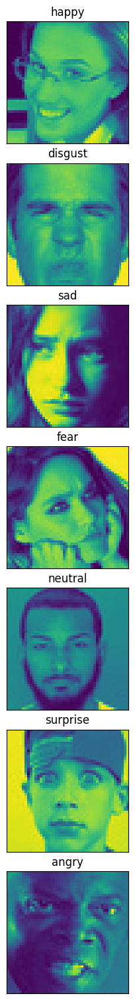

In [93]:
#Create a DataFrame with one label of each category
df_unique=train_df.copy().drop_duplicates(subset=["Label"]).reset_index()

#Displaying Some Images of the dataset
fig,axes=plt.subplots(nrows=7,ncols=1,figsize=(15,15),subplot_kw={'xticks':[],'yticks':[]})

for i,ax in enumerate(axes.flat):
  ax.imshow(plt.imread(df_unique.Filepath[i]))
  ax.set_title(df_unique.Label[i],fontsize=12)

plt.tight_layout(pad=0.5)
plt.show()

In [94]:
train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

In [95]:
#Training the image to create a new image and identify(Data Augmentation)
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224,224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,  # Corrected parameter name
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)


Found 28709 validated image filenames belonging to 7 classes.


In [96]:
#Testing the image to test a new image and identify
test_images = train_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224,224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False,
    seed=0,
)


Found 7178 validated image filenames belonging to 7 classes.


In [97]:
pretrained_model=tf.keras.applications.MobileNetV2(
    input_shape=(224,224,3),
    include_top=False,
    weights='imagenet',
    pooling='avg',
)
pretrained_model.trainable=False

**CNN Model**

In [78]:
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dropout
inputs = pretrained_model.input

x = tf.keras.layers.Dense(32, activation='relu', kernel_regularizer=l2(0.001))(pretrained_model.output)
x = tf.keras.layers.Dropout(0.2)(x)  # Add dropout after a dense layer to avoid overfitting
x = tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=l2(0.001))(pretrained_model.output)
x = tf.keras.layers.Dropout(0.2)(x)  # Add dropout after a dense layer
x = tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=l2(0.001))(pretrained_model.output)
x = tf.keras.layers.Dropout(0.2)(x)  # Add dropout after a dense layer
x = tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=l2(0.001))(pretrained_model.output)

outputs = tf.keras.layers.Dense(7, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=test_images,
    batch_size = 32,
    epochs=15,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)


Epoch 1/15
898/898 [==============================] - 60s 64ms/step - loss: 1.7071 - accuracy: 0.4114 - val_loss: 1.5651 - val_accuracy: 0.4404
Epoch 2/15
898/898 [==============================] - 56s 62ms/step - loss: 1.4914 - accuracy: 0.4630 - val_loss: 1.4756 - val_accuracy: 0.4660
Epoch 3/15
898/898 [==============================] - 55s 62ms/step - loss: 1.4467 - accuracy: 0.4768 - val_loss: 1.4668 - val_accuracy: 0.4664
Epoch 4/15
898/898 [==============================] - 55s 62ms/step - loss: 1.4164 - accuracy: 0.4863 - val_loss: 1.4996 - val_accuracy: 0.4531
Epoch 5/15
898/898 [==============================] - 56s 63ms/step - loss: 1.4044 - accuracy: 0.4937 - val_loss: 1.4225 - val_accuracy: 0.4880
Epoch 6/15
898/898 [==============================] - 56s 62ms/step - loss: 1.3914 - accuracy: 0.4949 - val_loss: 1.4169 - val_accuracy: 0.4890
Epoch 7/15
898/898 [==============================] - 55s 61ms/step - loss: 1.3720 - accuracy: 0.5074 - val_loss: 1.4187 - val_accuracy:

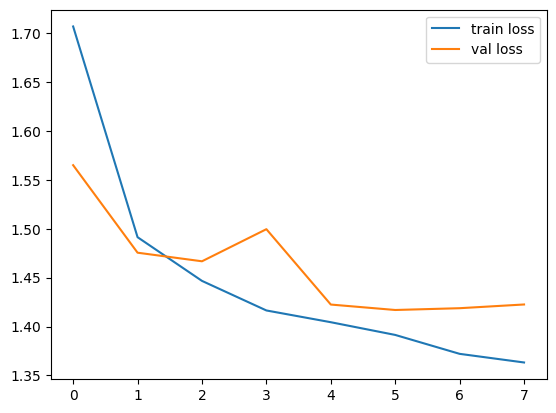

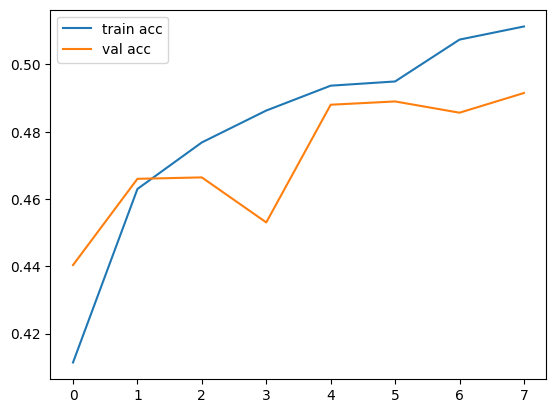

<Figure size 640x480 with 0 Axes>

In [98]:
# plot the loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [99]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)
# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred1 = [labels[k] for k in pred]
pred1


225/225 [==============================] - 11s 50ms/step


['sad',
 'surprise',
 'happy',
 'happy',
 'neutral',
 'fear',
 'sad',
 'sad',
 'fear',
 'happy',
 'neutral',
 'neutral',
 'neutral',
 'neutral',
 'happy',
 'surprise',
 'happy',
 'neutral',
 'happy',
 'angry',
 'happy',
 'neutral',
 'happy',
 'happy',
 'neutral',
 'neutral',
 'neutral',
 'neutral',
 'happy',
 'neutral',
 'surprise',
 'angry',
 'neutral',
 'neutral',
 'happy',
 'angry',
 'surprise',
 'sad',
 'angry',
 'happy',
 'angry',
 'happy',
 'sad',
 'neutral',
 'fear',
 'happy',
 'surprise',
 'fear',
 'sad',
 'happy',
 'neutral',
 'surprise',
 'sad',
 'fear',
 'happy',
 'happy',
 'neutral',
 'fear',
 'happy',
 'angry',
 'happy',
 'fear',
 'surprise',
 'happy',
 'happy',
 'angry',
 'fear',
 'happy',
 'sad',
 'happy',
 'fear',
 'neutral',
 'neutral',
 'neutral',
 'happy',
 'fear',
 'fear',
 'neutral',
 'happy',
 'surprise',
 'angry',
 'neutral',
 'neutral',
 'happy',
 'angry',
 'fear',
 'neutral',
 'happy',
 'surprise',
 'happy',
 'surprise',
 'fear',
 'happy',
 'surprise',
 'surpri

In [81]:
def output(location):
  img=load_img(location,target_size=(224,224,3))
  img=img_to_array(img)
  img=img/255
  img=np.expand_dims(img,[0])
  answer=model.predict(img)
  y_class=answer.argmax(axis=-1)
  y=" ".join(str(x) for x in y_class)
  y=int(y)
  res=labels[y]
  return res

**Predicting Mood/Emotion and Playing Song Accordingly**

1/1 [==============================] - 0s 50ms/step
The Predicted Mood Seems to be disgust.
Don't feel so Disgusted,Let Me Play Something to Refresh Your Mood


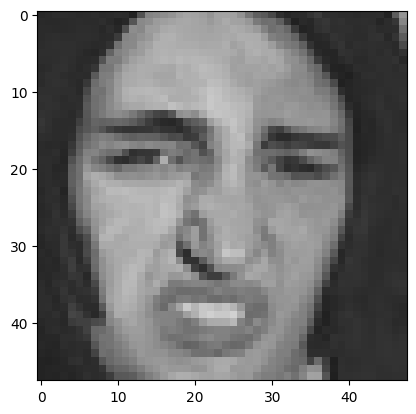

In [111]:
import numpy as np
from tensorflow.keras.preprocessing import image
import cv2

test_img= cv2.imread("/content/test/disgust/PrivateTest_52177909.jpg")
plt.imshow(test_img)

predicted_mood =output("/content/test/disgust/PrivateTest_52177909.jpg")

print(f"The Predicted Mood Seems to be {predicted_mood}.")


#Playing Music According to the Mood/Emotion Detected


#Importing required Libraries for Playing Song
from IPython.display import Audio,display
import random

#Standardizing the Path for all the Songs
angry_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/Pushpa X Jailer X Rolex X Be Notorius.mp3','/content/Hukum X Rolex X Vaathi Raid I Anirudh I Nelvin Keys.mp3']
disgust_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
fear_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3']
happy_song=['/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
neutral_song=['/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3','/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
sad_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
surprise_song=['/content/Pushpa X Jailer X Rolex X Be Notorius.mp3']

#Playing a Song Based on Emotion/Mood Detected by our Model
if predicted_mood == 'angry':
  print('Calm Down,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(angry_song)
  display(Audio(data1))
elif predicted_mood == 'disgust':
  print("Don't feel so Disgusted,Let Me Play Something to Refresh Your Mood")
  data1=random.choice(disgust_song)
  display(Audio(data1))
elif predicted_mood == 'fear':
  print("Don't worry,Let me Play Something to make you Feel Motivated")
  data1=random.choice(fear_song)
  display(Audio(data1))
elif predicted_mood == 'happy':
  print('You Seem to be very Jolly Today,here are some Musics for You')
  data1=random.choice(happy_song)
  display(Audio(data1))
elif predicted_mood == 'neutral':
  print('No Problem,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(neutral_song)
  display(Audio(data1))
elif predicted_mood == 'sad':
  print('Why so Sad?,I will Play Something to make you Feel Energetic and Happy')
  data1=random.choice(sad_song)
  display(Audio(data1))
elif predicted_mood == 'surprise':
  print('Seems like you are having an Instant Dopamine Rush,Let Me Play Something to make you Hit more Dopamine')
  data1=random.choice(surprise_song)
  display(Audio(data1))

else:
  print("This Model Currently don't Support this Emotion/Mood")


1/1 [==============================] - 0s 23ms/step
The Predicted Mood Seems to be happy.
You Seem to be very Jolly Today,here are some Musics for You


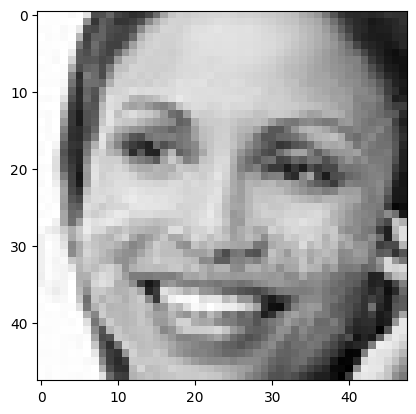

In [120]:
import numpy as np
from tensorflow.keras.preprocessing import image
import cv2

test_img= cv2.imread("/content/test/happy/PrivateTest_25630075.jpg")
plt.imshow(test_img)

predicted_mood =output("/content/test/happy/PrivateTest_25630075.jpg")

print(f"The Predicted Mood Seems to be {predicted_mood}.")


#Playing Music According to the Mood/Emotion Detected


#Importing required Libraries for Playing Song
from IPython.display import Audio,display
import random

#Standardizing the Path for all the Songs
angry_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/Pushpa X Jailer X Rolex X Be Notorius.mp3','/content/Hukum X Rolex X Vaathi Raid I Anirudh I Nelvin Keys.mp3']
disgust_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
fear_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3']
happy_song=['/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
neutral_song=['/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3','/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
sad_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
surprise_song=['/content/Pushpa X Jailer X Rolex X Be Notorius.mp3']

#Playing a Song Based on Emotion/Mood Detected by our Model
if predicted_mood == 'angry':
  print('Calm Down,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(angry_song)
  display(Audio(data1))
elif predicted_mood == 'disgust':
  print("Don't feel so Disgusted,Let Me Play Something to Refresh Your Mood")
  data1=random.choice(disgust_song)
  display(Audio(data1))
elif predicted_mood == 'fear':
  print("Don't worry,Let me Play Something to make you Feel Motivated")
  data1=random.choice(fear_song)
  display(Audio(data1))
elif predicted_mood == 'happy':
  print('You Seem to be very Jolly Today,here are some Musics for You')
  data1=random.choice(happy_song)
  display(Audio(data1))
elif predicted_mood == 'neutral':
  print('No Problem,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(neutral_song)
  display(Audio(data1))
elif predicted_mood == 'sad':
  print('Why so Sad?,I will Play Something to make you Feel Energetic and Happy')
  data1=random.choice(sad_song)
  display(Audio(data1))
elif predicted_mood == 'surprise':
  print('Seems like you are having an Instant Dopamine Rush,Let Me Play Something to make you Hit more Dopamine')
  data1=random.choice(surprise_song)
  display(Audio(data1))

else:
  print("This Model Currently don't Support this Emotion/Mood")


1/1 [==============================] - 0s 37ms/step
The Predicted Mood Seems to be surprise.
Seems like you are having an Instant Dopamine Rush,Let Me Play Something to make you Hit more Dopamine


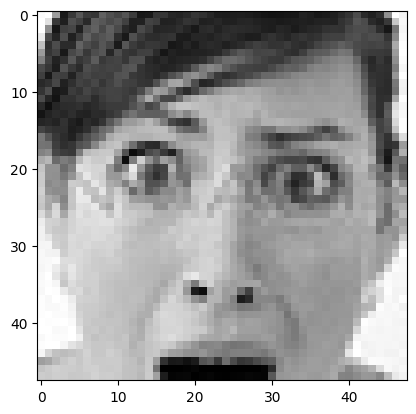

In [121]:
import numpy as np
from tensorflow.keras.preprocessing import image
import cv2

test_img= cv2.imread("/content/test/surprise/PrivateTest_20732965.jpg")
plt.imshow(test_img)

predicted_mood =output("/content/test/surprise/PrivateTest_20732965.jpg")

print(f"The Predicted Mood Seems to be {predicted_mood}.")


#Playing Music According to the Mood/Emotion Detected


#Importing required Libraries for Playing Song
from IPython.display import Audio,display
import random

#Standardizing the Path for all the Songs
angry_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/Pushpa X Jailer X Rolex X Be Notorius.mp3','/content/Hukum X Rolex X Vaathi Raid I Anirudh I Nelvin Keys.mp3']
disgust_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
fear_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3']
happy_song=['/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
neutral_song=['/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3','/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
sad_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
surprise_song=['/content/Pushpa X Jailer X Rolex X Be Notorius.mp3']

#Playing a Song Based on Emotion/Mood Detected by our Model
if predicted_mood == 'angry':
  print('Calm Down,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(angry_song)
  display(Audio(data1))
elif predicted_mood == 'disgust':
  print("Don't feel so Disgusted,Let Me Play Something to Refresh Your Mood")
  data1=random.choice(disgust_song)
  display(Audio(data1))
elif predicted_mood == 'fear':
  print("Don't worry,Let me Play Something to make you Feel Motivated")
  data1=random.choice(fear_song)
  display(Audio(data1))
elif predicted_mood == 'happy':
  print('You Seem to be very Jolly Today,here are some Musics for You')
  data1=random.choice(happy_song)
  display(Audio(data1))
elif predicted_mood == 'neutral':
  print('No Problem,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(neutral_song)
  display(Audio(data1))
elif predicted_mood == 'sad':
  print('Why so Sad?,I will Play Something to make you Feel Energetic and Happy')
  data1=random.choice(sad_song)
  display(Audio(data1))
elif predicted_mood == 'surprise':
  print('Seems like you are having an Instant Dopamine Rush,Let Me Play Something to make you Hit more Dopamine')
  data1=random.choice(surprise_song)
  display(Audio(data1))

else:
  print("This Model Currently don't Support this Emotion/Mood")


1/1 [==============================] - 0s 23ms/step
The Predicted Mood Seems to be neutral.
No Problem,Let Me Play Something to Refresh Your Mood


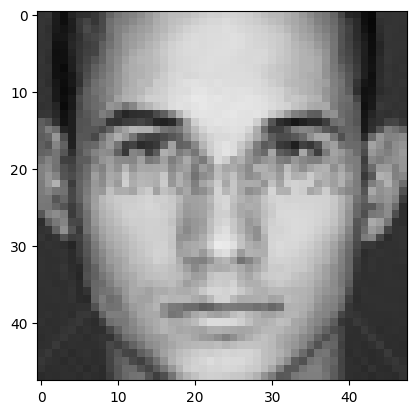

In [124]:
import numpy as np
from tensorflow.keras.preprocessing import image
import cv2

test_img= cv2.imread("/content/test/neutral/PrivateTest_12091739.jpg")
plt.imshow(test_img)

predicted_mood =output("/content/test/neutral/PrivateTest_12091739.jpg")

print(f"The Predicted Mood Seems to be {predicted_mood}.")


#Playing Music According to the Mood/Emotion Detected


#Importing required Libraries for Playing Song
from IPython.display import Audio,display
import random

#Standardizing the Path for all the Songs
angry_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/Pushpa X Jailer X Rolex X Be Notorius.mp3','/content/Hukum X Rolex X Vaathi Raid I Anirudh I Nelvin Keys.mp3']
disgust_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
fear_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3','/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3']
happy_song=['/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
neutral_song=['/content/y2mate.com - Namo Namo  Lyrical  Kedarnath  Sushant Rajput  Sara Ali Khan  Amit Trivedi  Amitabh B.mp3','/content/Jolly O Gymkhana X Peela Peela X Chella Kutti.mp3']
sad_song=['/content/y2mate.com - Powerful Hanuman chalisa bass boostedbass hanuman.mp3']
surprise_song=['/content/Pushpa X Jailer X Rolex X Be Notorius.mp3']

#Playing a Song Based on Emotion/Mood Detected by our Model
if predicted_mood == 'angry':
  print('Calm Down,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(angry_song)
  display(Audio(data1))
elif predicted_mood == 'disgust':
  print("Don't feel so Disgusted,Let Me Play Something to Refresh Your Mood")
  data1=random.choice(disgust_song)
  display(Audio(data1))
elif predicted_mood == 'fear':
  print("Don't worry,Let me Play Something to make you Feel Motivated")
  data1=random.choice(fear_song)
  display(Audio(data1))
elif predicted_mood == 'happy':
  print('You Seem to be very Jolly Today,here are some Musics for You')
  data1=random.choice(happy_song)
  display(Audio(data1))
elif predicted_mood == 'neutral':
  print('No Problem,Let Me Play Something to Refresh Your Mood')
  data1=random.choice(neutral_song)
  display(Audio(data1))
elif predicted_mood == 'sad':
  print('Why so Sad?,I will Play Something to make you Feel Energetic and Happy')
  data1=random.choice(sad_song)
  display(Audio(data1))
elif predicted_mood == 'surprise':
  print('Seems like you are having an Instant Dopamine Rush,Let Me Play Something to make you Hit more Dopamine')
  data1=random.choice(surprise_song)
  display(Audio(data1))

else:
  print("This Model Currently don't Support this Emotion/Mood")
